In [1]:
#import modules
import pandas as pd
import numpy as np
import re

# Custom preprocessing function
from utils import preprocess_text


# Vectorization methods
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [ ]:
#read csv that includes stock data
transcribed_list= pd.read_csv('transcribed_transcript_list2.csv')
transcribed_list.head(10)
print(transcribed_list['transcript'][0])

In [3]:
#transcript_prep_remarks
transcribed_list.head(5)

,Unnamed: 0,date,ticker,title,transcript,transcript_prep_remarks,url
0,0,10/29/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q4 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q4 2020 Earnings Conf...,"['Operator', 'Good day everyone and welcome to...",/article/4382943-apple-inc-aapl-ceo-tim-cook-o...
1,1,7/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q3 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q3 2020 Results Confe...,"['Operator', ""Good day, everyone. Welcome to t...",/article/4362707-apple-inc-aapl-ceo-tim-cook-o...
2,2,4/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q2 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q2 2020 Results Confe...,"['Operator', 'Good day everyone. Welcome to th...",/article/4341792-apple-inc-aapl-ceo-tim-cook-o...
3,3,1/28/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q1 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q1 2020 Results Confe...,"['Operator', ""Good day, everyone. Welcome to t...",/article/4319666-apple-inc-aapl-ceo-tim-cook-o...
4,8,10/30/2020,ABBV,AbbVie Inc.'s (ABBV) CEO Rick Gonzalez on Q3 2...,AbbVie Inc. (NYSE:ABBV) Q3 2020 Results Earnin...,"['Operator', 'Good morning and thank you for s...",/article/4383381-abbvie-inc-s-abbv-ceo-rick-go...


In [4]:
#add column that includes the total character count for each earning call transcrip
transcribed_list['char_count']= transcribed_list['transcript'].str.len()
transcribed_list[['transcript', 'char_count']].head()

,transcript,char_count
0,Apple Inc. (NASDAQ:AAPL) Q4 2020 Earnings Conf...,49717
1,Apple Inc. (NASDAQ:AAPL) Q3 2020 Results Confe...,46305
2,Apple Inc. (NASDAQ:AAPL) Q2 2020 Results Confe...,46869
3,Apple Inc. (NASDAQ:AAPL) Q1 2020 Results Confe...,46419
4,AbbVie Inc. (NYSE:ABBV) Q3 2020 Results Earnin...,75442


In [5]:
# reference link-https://stackoverflow.com/questions/8376691/how-to-remove-hashtag-user-link-of-a-tweet-using-regular-expression
# function to remove punctuation
import re,string
#('[^\w\s]','')
def strip_links(text):
    link_regex    =  re.compile('((https?):((//)|(\\\\))+([\w\d:#@%/;$()~_?\+-=\\\.&](#!)?)*)', re.DOTALL)
    links         = re.findall(link_regex, text)
    for link in links:
        text = text.replace(link[0], ', ')    
    return text

def strip_all_entities(text):
    entity_prefixes = ['@','#',""]
    for separator in  string.punctuation:
        if separator not in entity_prefixes :
            text = text.replace(separator,' ')
    words = []
    for word in text.split():
        word = word.strip()
        if word:
            if word[0] not in entity_prefixes:
                words.append(word)
    return ' '.join(words)

In [6]:
#apply function above to transcript column
transcribed_list['no_punctuation']=transcribed_list['transcript'].map(lambda x:strip_all_entities(strip_links(x)))

print(transcribed_list['no_punctuation'][0:6])

0    Apple Inc NASDAQ AAPL Q4 2020 Earnings Confere...
1    Apple Inc NASDAQ AAPL Q3 2020 Results Conferen...
2    Apple Inc NASDAQ AAPL Q2 2020 Results Conferen...
3    Apple Inc NASDAQ AAPL Q1 2020 Results Conferen...
4    AbbVie Inc NYSE ABBV Q3 2020 Results Earnings ...
5    AbbVie Inc NYSE ABBV Q2 2020 Earnings Conferen...
Name: no_punctuation, dtype: object


In [7]:
#remove quotes and apostrophes
transcribed_list['no_punctuation']=transcribed_list['no_punctuation'].str.replace('[^\w\s]','')
print(transcribed_list['no_punctuation'][0:6])

0    Apple Inc NASDAQ AAPL Q4 2020 Earnings Confere...
1    Apple Inc NASDAQ AAPL Q3 2020 Results Conferen...
2    Apple Inc NASDAQ AAPL Q2 2020 Results Conferen...
3    Apple Inc NASDAQ AAPL Q1 2020 Results Conferen...
4    AbbVie Inc NYSE ABBV Q3 2020 Results Earnings ...
5    AbbVie Inc NYSE ABBV Q2 2020 Earnings Conferen...
Name: no_punctuation, dtype: object


In [8]:
#preprocess latest transcriped list with preprocess function in utils.py file

transcribed_list['preprocess_trans']= transcribed_list['no_punctuation'].apply(lambda x : ' '.join(preprocess_text(x, min_word_length=4)))
print(transcribed_list['preprocess_trans'][0:6])

0    apple nasdaq aapl earn conference call october...
1    apple nasdaq aapl result conference call july ...
2    apple nasdaq aapl result conference call april...
3    apple nasdaq aapl result conference call janua...
4    abbvie nyse abbv result earn conference call o...
5    abbvie nyse abbv earn conference call july com...
Name: preprocess_trans, dtype: object


In [9]:
# removal words used infrequently @10% of the amount of transcripts

in_freq_words = pd.Series(' '.join(transcribed_list['preprocess_trans']).split()).value_counts()[-400:]
in_freq_words.head()

bidmc           1
quietly         1
armourdale      1
supercenters    1
interfacing     1
dtype: int64

In [10]:
# list frequent words @10% of the amount of transcripts

freq_words = pd.Series(' '.join(transcribed_list['preprocess_trans']).split()).value_counts()[400:]
freq_words.head()

date           914
information    913
hard           910
deposit        905
type           903
dtype: int64

In [11]:
# Removing the infrequent words from the  transcript file
in_freq_words = list(in_freq_words.index)
transcribed_list['clean_trans'] = transcribed_list['preprocess_trans'].apply(lambda x: " ".join(x for x in x.split() if x not in in_freq_words))
transcribed_list['clean_trans'].head()

0    apple nasdaq aapl earn conference call october...
1    apple nasdaq aapl result conference call july ...
2    apple nasdaq aapl result conference call april...
3    apple nasdaq aapl result conference call janua...
4    abbvie nyse abbv result earn conference call o...
Name: clean_trans, dtype: object

In [12]:
#list to include most common words
all_words = []
for line in list(transcribed_list['clean_trans']):
    words = line.split()
    for word in words:
        all_words.append(word.lower())
print(all_words[10])

featured_words = list(all_words)[:1000]
print(featured_words)

gala
['apple', 'nasdaq', 'aapl', 'earn', 'conference', 'call', 'october', 'company', 'participant', 'tejas', 'gala', 'senior', 'manager', 'corporate', 'finance', 'investor', 'relation', 'cook', 'chief', 'executive', 'officer', 'luca', 'maestro', 'senior', 'vice', 'president', 'chief', 'financial', 'officer', 'conference', 'call', 'participant', 'shannon', 'cross', 'cross', 'research', 'jeriel', 'deutsche', 'bank', 'katy', 'huberty', 'morgan', 'stanley', 'amit', 'daryanani', 'evercore', 'samik', 'chatterjee', 'morgan', 'krish', 'sankar', 'cowen', 'company', 'kyle', 'mcnealy', 'jefferies', 'chris', 'caso', 'raymond', 'operator', 'good', 'everyone', 'welcome', 'apple', 'fourth', 'quarter', 'fiscal', 'year', 'earn', 'conference', 'call', 'today', 'call', 'record', 'time', 'open', 'remark', 'introduction', 'turn', 'tejas', 'gala', 'senior', 'analyst', 'corporate', 'finance', 'investor', 'relation', 'please', 'ahead', 'tejas', 'gala', 'thank', 'good', 'afternoon', 'thank', 'join', 'speak', '

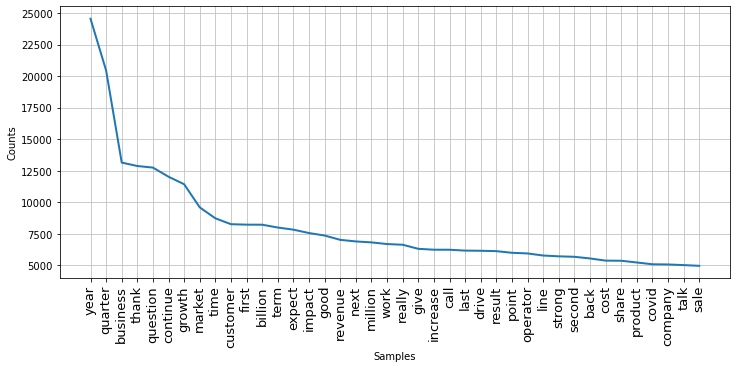

<Figure size 432x288 with 0 Axes>

In [13]:
import nltk
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,5))
plt.xticks(fontsize=13, rotation=90)
fd = nltk.FreqDist(all_words)
#display top word frequency of the top 40 words
fd.plot(40,cumulative=False)

# Exports graph as a png image file
plt.savefig("Fig1Top40Words_FullTrans.png")

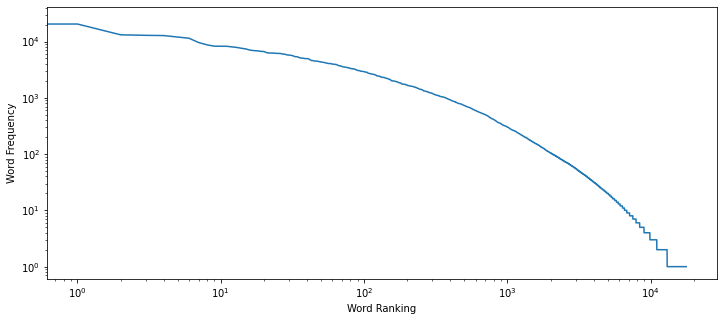

In [14]:
# log-log of all words
from collections import Counter
word_counts = sorted(Counter(all_words).values(), reverse=True)
plt.figure(figsize=(12,5))
plt.loglog(word_counts, linestyle='-', linewidth=1.5)
plt.ylabel("Word Frequency")
plt.xlabel("Word Ranking")

# Exports graph as a png image file
plt.savefig("Fig2WordFreqandRank_FullTrans.png")

In [15]:
#verify latest dataframe column output
transcribed_list.head()

,Unnamed: 0,date,ticker,title,transcript,transcript_prep_remarks,url,char_count,no_punctuation,preprocess_trans,clean_trans
0,0,10/29/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q4 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q4 2020 Earnings Conf...,"['Operator', 'Good day everyone and welcome to...",/article/4382943-apple-inc-aapl-ceo-tim-cook-o...,49717,Apple Inc NASDAQ AAPL Q4 2020 Earnings Confere...,apple nasdaq aapl earn conference call october...,apple nasdaq aapl earn conference call october...
1,1,7/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q3 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q3 2020 Results Confe...,"['Operator', ""Good day, everyone. Welcome to t...",/article/4362707-apple-inc-aapl-ceo-tim-cook-o...,46305,Apple Inc NASDAQ AAPL Q3 2020 Results Conferen...,apple nasdaq aapl result conference call july ...,apple nasdaq aapl result conference call july ...
2,2,4/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q2 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q2 2020 Results Confe...,"['Operator', 'Good day everyone. Welcome to th...",/article/4341792-apple-inc-aapl-ceo-tim-cook-o...,46869,Apple Inc NASDAQ AAPL Q2 2020 Results Conferen...,apple nasdaq aapl result conference call april...,apple nasdaq aapl result conference call april...
3,3,1/28/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q1 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q1 2020 Results Confe...,"['Operator', ""Good day, everyone. Welcome to t...",/article/4319666-apple-inc-aapl-ceo-tim-cook-o...,46419,Apple Inc NASDAQ AAPL Q1 2020 Results Conferen...,apple nasdaq aapl result conference call janua...,apple nasdaq aapl result conference call janua...
4,8,10/30/2020,ABBV,AbbVie Inc.'s (ABBV) CEO Rick Gonzalez on Q3 2...,AbbVie Inc. (NYSE:ABBV) Q3 2020 Results Earnin...,"['Operator', 'Good morning and thank you for s...",/article/4383381-abbvie-inc-s-abbv-ceo-rick-go...,75442,AbbVie Inc NYSE ABBV Q3 2020 Results Earnings ...,abbvie nyse abbv result earn conference call o...,abbvie nyse abbv result earn conference call o...


In [16]:
#remove stop words
from sklearn.feature_extraction import text #import package

skl_stopwords = text.ENGLISH_STOP_WORDS
#print(skl_stopwords)

from nltk.corpus import stopwords # for excluding the stopwords

#creating an object using the default nltk stopwords
nltk_stopwords = stopwords.words("english")
print(nltk_stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [17]:
#remove stop words from latest cleaned transcript
transcribed_list['clean_trans2']=transcribed_list['clean_trans'].apply(lambda x: " ".join(x for x in x.split() if x not in nltk_stopwords))
transcribed_list['clean_trans2'][:6]

0    apple nasdaq aapl earn conference call october...
1    apple nasdaq aapl result conference call july ...
2    apple nasdaq aapl result conference call april...
3    apple nasdaq aapl result conference call janua...
4    abbvie nyse abbv result earn conference call o...
5    abbvie nyse abbv earn conference call july com...
Name: clean_trans2, dtype: object

In [18]:
from sklearn.feature_extraction.text import CountVectorizer

# Now eliminaing customized stop words
count_vect = CountVectorizer(binary=False, stop_words = nltk_stopwords) 

count_vect_custom_stopwords = count_vect.fit_transform(transcribed_list['clean_trans2'])
print(count_vect_custom_stopwords.shape)
print(count_vect_custom_stopwords)

names = count_vect.get_feature_names()   
count = np.sum(count_vect_custom_stopwords.toarray(), axis = 0) 
count2 = count.tolist() 



(401, 17688)
  (0, 956)	53
  (0, 10322)	1
  (0, 118)	1
  (0, 4884)	4
  (0, 3253)	4
  (0, 2294)	15
  (0, 10826)	3
  (0, 3127)	14
  (0, 11367)	2
  (0, 15676)	7
  (0, 6332)	5
  (0, 14164)	3
  (0, 9305)	1
  (0, 3513)	2
  (0, 5878)	2
  (0, 8083)	5
  (0, 13131)	3
  (0, 3464)	3
  (0, 2728)	2
  (0, 5520)	1
  (0, 10846)	2
  (0, 9144)	13
  (0, 9231)	3
  (0, 17004)	1
  (0, 12182)	1
  :	:
  (400, 3602)	1
  (400, 4564)	2
  (400, 8405)	1
  (400, 2337)	1
  (400, 10127)	2
  (400, 11323)	6
  (400, 10768)	2
  (400, 7034)	1
  (400, 3873)	1
  (400, 9281)	2
  (400, 16368)	2
  (400, 13357)	1
  (400, 6254)	1
  (400, 1257)	1
  (400, 8423)	1
  (400, 3804)	1
  (400, 9960)	1
  (400, 2994)	1
  (400, 160)	1
  (400, 16541)	1
  (400, 12780)	1
  (400, 6813)	1
  (400, 8690)	1
  (400, 5581)	1
  (400, 5839)	1


In [19]:
#dataframe of output
count_df = pd.DataFrame(count2, index = names, columns = ['Word Count']) 
#  top 20 features by count
count_df.sort_values(['Word Count'], ascending = False)[:20]


,Word Count
year,24545
quarter,20441
business,13147
thank,12874
question,12749
continue,12024
growth,11428
market,9596
time,8729
customer,8264


In [21]:
# import SentimentIntensityAnalyzer class 
# from vaderSentiment.vaderSentiment module. 
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


In [23]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
def getSentimentScores(text):
    score=SentimentIntensityAnalyzer()
    #dictionary
    sentiment_dict=score.polarity_scores(text)
    print(sentiment_dict)
    print(f'positive sentiment: {sentiment_dict["pos"]*100}, %positive')
    print(f'neutral sentiment: {sentiment_dict["neu"]*100}, %neutral')
    print(f'negative sentiment: {sentiment_dict["neg"]*100}, %negative')
    #decide sentiment 
    if sentiment_dict['compound'] > 0.075:
        print ('Positive')
    elif sentiment_dict['compound'] < 0.025:
        print ('Negative')
    else: 
        print ('Neutral')
    return sentiment_dict

In [24]:
###modified 2
transcribed_list['sentiment_compound']=transcribed_list['clean_trans2'].apply(lambda x: getSentimentScores(x)['compound'])

{'neg': 0.049, 'neu': 0.712, 'pos': 0.239, 'compound': 1.0}
positive sentiment: 23.9, %positive
neutral sentiment: 71.2, %neutral
negative sentiment: 4.9, %negative
Positive
{'neg': 0.037, 'neu': 0.701, 'pos': 0.262, 'compound': 1.0}
positive sentiment: 26.200000000000003, %positive
neutral sentiment: 70.1, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.037, 'neu': 0.735, 'pos': 0.228, 'compound': 1.0}
positive sentiment: 22.8, %positive
neutral sentiment: 73.5, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.034, 'neu': 0.731, 'pos': 0.235, 'compound': 1.0}
positive sentiment: 23.5, %positive
neutral sentiment: 73.1, %neutral
negative sentiment: 3.4000000000000004, %negative
Positive
{'neg': 0.035, 'neu': 0.695, 'pos': 0.269, 'compound': 1.0}
positive sentiment: 26.900000000000002, %positive
neutral sentiment: 69.5, %neutral
negative sentiment: 3.5000000000000004, %negative
Positive
{'neg': 0.042, 'neu': 0.708, 'pos': 0.25, 

In [29]:
###modified 2
transcribed_list['sentiment_pos']=transcribed_list['clean_trans2'].apply(lambda x: getSentimentScores(x)['pos'])

{'neg': 0.049, 'neu': 0.712, 'pos': 0.239, 'compound': 1.0}
positive sentiment: 23.9, %positive
neutral sentiment: 71.2, %neutral
negative sentiment: 4.9, %negative
Positive
{'neg': 0.037, 'neu': 0.701, 'pos': 0.262, 'compound': 1.0}
positive sentiment: 26.200000000000003, %positive
neutral sentiment: 70.1, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.037, 'neu': 0.735, 'pos': 0.228, 'compound': 1.0}
positive sentiment: 22.8, %positive
neutral sentiment: 73.5, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.034, 'neu': 0.731, 'pos': 0.235, 'compound': 1.0}
positive sentiment: 23.5, %positive
neutral sentiment: 73.1, %neutral
negative sentiment: 3.4000000000000004, %negative
Positive
{'neg': 0.035, 'neu': 0.695, 'pos': 0.269, 'compound': 1.0}
positive sentiment: 26.900000000000002, %positive
neutral sentiment: 69.5, %neutral
negative sentiment: 3.5000000000000004, %negative
Positive
{'neg': 0.042, 'neu': 0.708, 'pos': 0.25, 

In [30]:
###modified 2
transcribed_list['sentiment_neg']=transcribed_list['clean_trans2'].apply(lambda x: getSentimentScores(x)['neg'])

{'neg': 0.049, 'neu': 0.712, 'pos': 0.239, 'compound': 1.0}
positive sentiment: 23.9, %positive
neutral sentiment: 71.2, %neutral
negative sentiment: 4.9, %negative
Positive
{'neg': 0.037, 'neu': 0.701, 'pos': 0.262, 'compound': 1.0}
positive sentiment: 26.200000000000003, %positive
neutral sentiment: 70.1, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.037, 'neu': 0.735, 'pos': 0.228, 'compound': 1.0}
positive sentiment: 22.8, %positive
neutral sentiment: 73.5, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.034, 'neu': 0.731, 'pos': 0.235, 'compound': 1.0}
positive sentiment: 23.5, %positive
neutral sentiment: 73.1, %neutral
negative sentiment: 3.4000000000000004, %negative
Positive
{'neg': 0.035, 'neu': 0.695, 'pos': 0.269, 'compound': 1.0}
positive sentiment: 26.900000000000002, %positive
neutral sentiment: 69.5, %neutral
negative sentiment: 3.5000000000000004, %negative
Positive
{'neg': 0.042, 'neu': 0.708, 'pos': 0.25, 

In [31]:
###modified 2
transcribed_list['sentiment_neu']=transcribed_list['clean_trans2'].apply(lambda x: getSentimentScores(x)['neu'])

{'neg': 0.049, 'neu': 0.712, 'pos': 0.239, 'compound': 1.0}
positive sentiment: 23.9, %positive
neutral sentiment: 71.2, %neutral
negative sentiment: 4.9, %negative
Positive
{'neg': 0.037, 'neu': 0.701, 'pos': 0.262, 'compound': 1.0}
positive sentiment: 26.200000000000003, %positive
neutral sentiment: 70.1, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.037, 'neu': 0.735, 'pos': 0.228, 'compound': 1.0}
positive sentiment: 22.8, %positive
neutral sentiment: 73.5, %neutral
negative sentiment: 3.6999999999999997, %negative
Positive
{'neg': 0.034, 'neu': 0.731, 'pos': 0.235, 'compound': 1.0}
positive sentiment: 23.5, %positive
neutral sentiment: 73.1, %neutral
negative sentiment: 3.4000000000000004, %negative
Positive
{'neg': 0.035, 'neu': 0.695, 'pos': 0.269, 'compound': 1.0}
positive sentiment: 26.900000000000002, %positive
neutral sentiment: 69.5, %neutral
negative sentiment: 3.5000000000000004, %negative
Positive
{'neg': 0.042, 'neu': 0.708, 'pos': 0.25, 

In [32]:
transcribed_list.head(3)


,Unnamed: 0,date,ticker,title,transcript,transcript_prep_remarks,url,char_count,no_punctuation,preprocess_trans,clean_trans,clean_trans2,sentiment_compound,sentiment_pos,sentiment_neg,sentiment_neu
0,0,10/29/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q4 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q4 2020 Earnings Conf...,"['Operator', 'Good day everyone and welcome to...",/article/4382943-apple-inc-aapl-ceo-tim-cook-o...,49717,Apple Inc NASDAQ AAPL Q4 2020 Earnings Confere...,apple nasdaq aapl earn conference call october...,apple nasdaq aapl earn conference call october...,apple nasdaq aapl earn conference call october...,1.0,0.239,0.049,0.712
1,1,7/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q3 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q3 2020 Results Confe...,"['Operator', ""Good day, everyone. Welcome to t...",/article/4362707-apple-inc-aapl-ceo-tim-cook-o...,46305,Apple Inc NASDAQ AAPL Q3 2020 Results Conferen...,apple nasdaq aapl result conference call july ...,apple nasdaq aapl result conference call july ...,apple nasdaq aapl result conference call july ...,1.0,0.262,0.037,0.701
2,2,4/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q2 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q2 2020 Results Confe...,"['Operator', 'Good day everyone. Welcome to th...",/article/4341792-apple-inc-aapl-ceo-tim-cook-o...,46869,Apple Inc NASDAQ AAPL Q2 2020 Results Conferen...,apple nasdaq aapl result conference call april...,apple nasdaq aapl result conference call april...,apple nasdaq aapl result conference call april...,1.0,0.228,0.037,0.735


In [33]:
transcribed_list.columns

Index(['Unnamed: 0', 'date', 'ticker', 'title', 'transcript',
       'transcript_prep_remarks', 'url', 'char_count', 'no_punctuation',
       'preprocess_trans', 'clean_trans', 'clean_trans2', 'sentiment_compound',
       'sentiment_pos', 'sentiment_neg', 'sentiment_neu'],
      dtype='object')

In [34]:
transcribed_list.to_csv('full_transcript_Vader_sents.csv')

In [ ]:
#if already saved read the csv with stored sentiments from Vader
trans_Vader_sents = pd.read_csv('full_transcript_Vader_sents.csv')

In [35]:
#SIA using HL model
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(score)))
    return score

In [36]:

transcribed_list['sentiment_HL2']=transcribed_list.clean_trans2.apply(lambda x: sentiment_analyzer_scores(x))
#transcribed_list['sentiment_decide']=transcribed_list['sentiment_compound'].apply(lambda x: decideSentiment(x))

apple nasdaq aapl earn conference call october company participant tejas gala senior manager corporate finance investor relation cook chief executive officer luca maestro senior vice president chief financial officer conference call participant shannon cross cross research jeriel deutsche bank katy huberty morgan stanley amit daryanani evercore samik chatterjee morgan krish sankar cowen company kyle mcnealy jefferies chris caso raymond operator good everyone welcome apple fourth quarter fiscal year earn conference call today call record time open remark introduction turn tejas gala senior analyst corporate finance investor relation please ahead tejas gala thank good afternoon thank join speak first today apple cook follow luca maestro open call question analyst please note information hear discussion today consist forward statement include without limitation regard revenue gross margin operate expense income expense capital allocation future business outlook include potential impact co

In [37]:
transcribed_list['sentiment_HL2']

0      {'neg': 0.049, 'neu': 0.712, 'pos': 0.239, 'co...
1      {'neg': 0.037, 'neu': 0.701, 'pos': 0.262, 'co...
2      {'neg': 0.037, 'neu': 0.735, 'pos': 0.228, 'co...
3      {'neg': 0.034, 'neu': 0.731, 'pos': 0.235, 'co...
4      {'neg': 0.035, 'neu': 0.695, 'pos': 0.269, 'co...
                             ...                        
396    {'neg': 0.052, 'neu': 0.733, 'pos': 0.215, 'co...
397    {'neg': 0.058, 'neu': 0.717, 'pos': 0.226, 'co...
398    {'neg': 0.07, 'neu': 0.721, 'pos': 0.209, 'com...
399    {'neg': 0.052, 'neu': 0.685, 'pos': 0.262, 'co...
400    {'neg': 0.048, 'neu': 0.675, 'pos': 0.277, 'co...
Name: sentiment_HL2, Length: 401, dtype: object

In [50]:
#delete
transcribed_list_sents2=transcribed_list[['clean_trans2', 'sentiments2']]
transcribed_list_sents2.head(5)

,clean_trans2,sentiments2
0,operator good everyone welcome apple fourth qu...,None
1,operator good everyone welcome apple incorpora...,None
2,operator good everyone welcome apple incorpora...,None
3,operator good everyone welcome apple incorpora...,None
4,operator good morning thank stand welcome abbv...,None


In [36]:
#delete
transcribed_list['clean_trans2']

0      operator good everyone welcome apple fourth qu...
1      operator good everyone welcome apple incorpora...
2      operator good everyone welcome apple incorpora...
3      operator good everyone welcome apple incorpora...
4      operator good morning thank stand welcome abbv...
                             ...                        
396                                                     
397    operator good everyone welcome exxon mobil cor...
398    operator good everyone welcome exxon mobil cor...
399    operator good everyone welcome exxon mobil cor...
400    operator good everyone welcome exxon mobil cor...
Name: clean_trans2, Length: 401, dtype: object

In [37]:
#delete
sent_list[1]

In [38]:
#delete
getSentimentScores(transcribed_list['clean_trans2'][10])

{'neg': 0.043, 'neu': 0.733, 'pos': 0.223, 'compound': 0.9996}
positive sentiment: 22.3, %positive
neutral sentiment: 73.3, %neutral
negative sentiment: 4.3, %negative
Positive


In [38]:
transcribed_list.head(3)

,Unnamed: 0,date,ticker,title,transcript,transcript_prep_remarks,url,char_count,no_punctuation,preprocess_trans,clean_trans,clean_trans2,sentiment_compound,sentiment_neu,sentiment_neg,sentiment_pos,sentiment_HL2
0,0,10/29/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q4 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q4 2020 Earnings Conf...,"['Operator', 'Good day everyone and welcome to...",/article/4382943-apple-inc-aapl-ceo-tim-cook-o...,24264,Operator Good day everyone and welcome to the ...,operator good everyone welcome apple fourth qu...,operator good everyone welcome apple fourth qu...,operator good everyone welcome apple fourth qu...,0.9999,0.704,0.049,0.246,None
1,1,7/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q3 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q3 2020 Results Confe...,"['Operator', ""Good day, everyone. Welcome to t...",/article/4362707-apple-inc-aapl-ceo-tim-cook-o...,22271,Operator Good day everyone Welcome to the Appl...,operator good everyone welcome apple incorpora...,operator good everyone welcome apple incorpora...,operator good everyone welcome apple incorpora...,0.9999,0.701,0.041,0.258,None
2,2,4/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q2 2020 Resu...,Apple Inc. (NASDAQ:AAPL) Q2 2020 Results Confe...,"['Operator', 'Good day everyone. Welcome to th...",/article/4341792-apple-inc-aapl-ceo-tim-cook-o...,25445,Operator Good day everyone Welcome to the Appl...,operator good everyone welcome apple incorpora...,operator good everyone welcome apple incorpora...,operator good everyone welcome apple incorpora...,0.9999,0.728,0.042,0.230,None


In [39]:
transcribed_list_sent= transcribed_list.drop(['Unnamed: 0','transcript','transcript_prep_remarks', 'url', 'char_count', 'no_punctuation',
       'preprocess_trans', 'clean_trans',
        'sentiment_compound',
       'sentiment_HL2'],1)

transcribed_list_sent.head(3)     

,date,ticker,title,clean_trans2,sentiment_neu,sentiment_neg,sentiment_pos
0,10/29/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q4 2020 Resu...,operator good everyone welcome apple fourth qu...,0.704,0.049,0.246
1,7/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q3 2020 Resu...,operator good everyone welcome apple incorpora...,0.701,0.041,0.258
2,4/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q2 2020 Resu...,operator good everyone welcome apple incorpora...,0.728,0.042,0.230


In [40]:
transcribed_list_sent.columns

Index(['date', 'ticker', 'title', 'clean_trans2', 'sentiment_neu',
       'sentiment_neg', 'sentiment_pos'],
      dtype='object')

In [49]:
transcribed_list_sent[['sentiment_neu',
       'sentiment_neg', 'sentiment_pos']].describe()

,sentiment_neu,sentiment_neg,sentiment_pos
count,401.000000,401.000000,401.000000
mean,0.688504,0.044289,0.234800
std,0.130240,0.020481,0.056457
min,0.000000,0.000000,0.000000
25%,0.688000,0.031000,0.216000
50%,0.709000,0.043000,0.242000
75%,0.730000,0.058000,0.266000
max,0.841000,0.101000,0.355000


In [41]:
#read list of words for positive and negative descriptors
HLpos = [line.strip() for line in  open('HLpos.txt','r')]
HLneg = [line.strip() for line in  open('HLneg.txt','r',encoding = 'latin-1')]
print("HL pos  size: " + str(len(HLpos)))
print(HLpos[0:10])
print("HL neg  size: " + str(len(HLneg)))
print(HLneg[0:10])

HL pos  size: 2006
['a+', 'abound', 'abounds', 'abundance', 'abundant', 'accessable', 'accessible', 'acclaim', 'acclaimed', 'acclamation']
HL neg  size: 4783
['2-faced', '2-faces', 'abnormal', 'abolish', 'abominable', 'abominably', 'abominate', 'abomination', 'abort', 'aborted']


In [50]:
# trying a different measure using a different dictionary
def hl_sent(inputstring):
    poscount = 0
    negcount = 0
    for word in inputstring.split(): 
        if HLpos.count(word.rstrip('?:!.,;')):
            poscount +=1
        elif HLneg.count(word.rstrip('?:!.,;')):
            negcount +=1
    if poscount+negcount > 0:
        t = float((poscount - negcount)/(poscount+negcount))    
    else:
        t = 0
    if t > 0.20:
        tone = "Positive"
    elif t < 0.04:
        tone = "Negative"
    else:
        tone = "Neutral"
    return tone

In [51]:
#takes a little longer - needs to check multiple lists
transcribed_list_sent['sentimentsHL'] = transcribed_list_sent.clean_trans2.apply(lambda x: hl_sent(x))
#then use following code to see both columns 
transcribed_list_sent.iloc[0:10][['clean_trans2', 
       'sentiment_pos', 'sentiment_neg', 'sentiment_neu']]

#transcribed_list['sentiment_compound']=transcribed_list['clean_trans2'].apply(lambda x: getSentimentScores(x)['compound'])



,clean_trans2,sentiment_pos,sentiment_neg,sentiment_neu
0,operator good everyone welcome apple fourth qu...,0.246,0.049,0.704
1,operator good everyone welcome apple incorpora...,0.258,0.041,0.701
2,operator good everyone welcome apple incorpora...,0.230,0.042,0.728
3,operator good everyone welcome apple incorpora...,0.247,0.033,0.720
4,operator good morning thank stand welcome abbv...,0.256,0.031,0.714
5,operator good morning thank stand welcome abbv...,0.194,0.044,0.762
6,operator good morning thank stand welcome abbv...,0.199,0.066,0.735
7,operator good morning thank stand welcome abbv...,0.237,0.049,0.714
8,operator good morning thank stand welcome abbo...,0.236,0.043,0.721
9,operator good morning thank stand welcome abbo...,0.223,0.056,0.721


In [52]:
transcribed_list_sent['sentimentsHL'].value_counts()

Positive    374
Negative     16
Neutral      11
Name: sentimentsHL, dtype: int64

In [53]:
transcribed_list_sent

,date,ticker,title,clean_trans2,sentiment_neu,sentiment_neg,sentiment_pos,sentimentsHL
0,10/29/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q4 2020 Resu...,operator good everyone welcome apple fourth qu...,0.704,0.049,0.246,Positive
1,7/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q3 2020 Resu...,operator good everyone welcome apple incorpora...,0.701,0.041,0.258,Positive
2,4/30/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q2 2020 Resu...,operator good everyone welcome apple incorpora...,0.728,0.042,0.230,Positive
3,1/28/2020,AAPL,Apple Inc. (AAPL) CEO Tim Cook on Q1 2020 Resu...,operator good everyone welcome apple incorpora...,0.720,0.033,0.247,Positive
4,10/30/2020,ABBV,AbbVie Inc.'s (ABBV) CEO Rick Gonzalez on Q3 2...,operator good morning thank stand welcome abbv...,0.714,0.031,0.256,Positive
...,...,...,...,...,...,...,...,...
396,5/19/2020,WMT,"Walmart, Inc. (WMT) CEO Doug McMillon on Q1 20...",,0.000,0.000,0.000,Negative
397,10/30/2020,XOM,Exxon Mobil Corporation (XOM) Q3 2020 Results ...,operator good everyone welcome exxon mobil cor...,0.721,0.069,0.210,Positive
398,7/31/2020,XOM,Exxon Mobil Corp (XOM) Q2 2020 Results - Earni...,operator good everyone welcome exxon mobil cor...,0.723,0.077,0.200,Positive
399,5/1/2020,XOM,Exxon Mobil Corporation (XOM) CEO Darren Woods...,operator good everyone welcome exxon mobil cor...,0.708,0.074,0.218,Positive


In [54]:
transcribed_list_sent['sentimentsVA'] = transcribed_list_sent.clean_trans2.apply(lambda x: hl_sent(x))
#then use following code to see both columns 
transcribed_list_sent.iloc[0:10][['clean_trans2', 
       'sentiment_pos', 'sentiment_neg', 'sentiment_neu']]

,clean_trans2,sentiment_pos,sentiment_neg,sentiment_neu
0,operator good everyone welcome apple fourth qu...,0.246,0.049,0.704
1,operator good everyone welcome apple incorpora...,0.258,0.041,0.701
2,operator good everyone welcome apple incorpora...,0.230,0.042,0.728
3,operator good everyone welcome apple incorpora...,0.247,0.033,0.720
4,operator good morning thank stand welcome abbv...,0.256,0.031,0.714
5,operator good morning thank stand welcome abbv...,0.194,0.044,0.762
6,operator good morning thank stand welcome abbv...,0.199,0.066,0.735
7,operator good morning thank stand welcome abbv...,0.237,0.049,0.714
8,operator good morning thank stand welcome abbo...,0.236,0.043,0.721
9,operator good morning thank stand welcome abbo...,0.223,0.056,0.721


In [56]:
transcribed_list_sent.tail(3)

,date,ticker,title,clean_trans2,sentiment_neu,sentiment_neg,sentiment_pos,sentimentsHL,sentimentsVA
398,7/31/2020,XOM,Exxon Mobil Corp (XOM) Q2 2020 Results - Earni...,operator good everyone welcome exxon mobil cor...,0.723,0.077,0.200,Positive,Positive
399,5/1/2020,XOM,Exxon Mobil Corporation (XOM) CEO Darren Woods...,operator good everyone welcome exxon mobil cor...,0.708,0.074,0.218,Positive,Positive
400,1/31/2020,XOM,Exxon Mobil Corporation (XOM) CEO Darren Woods...,operator good everyone welcome exxon mobil cor...,0.686,0.054,0.260,Positive,Positive


In [ ]:
transcribed_list_sent.to_csv('transcript_VadernHL_sents.csv')